# Notebook 1. FCCU Data Audit and Compact Journal-Style Analysis

This notebook is dedicated only to scientific data understanding and publication-oriented exploratory analysis.
It contains the compact set of tables and visualizations needed to justify the FCCU forecasting problem, verify data quality, and motivate the later ML and DL workflows.

Scope:
- process-variable and target mapping,
- data-quality audit,
- compact exploratory analysis,
- representative scenario dynamics,
- temporal diagnostics useful for forecasting design.

In [1]:
    import gc
    import os
    import platform
    import random
    import time
    import warnings
    from pathlib import Path

    os.environ.setdefault('OMP_NUM_THREADS', '1')
    os.environ.setdefault('OPENBLAS_NUM_THREADS', '1')
    os.environ.setdefault('MKL_NUM_THREADS', '1')
    os.environ.setdefault('VECLIB_MAXIMUM_THREADS', '1')
    os.environ.setdefault('NUMEXPR_NUM_THREADS', '1')
    os.environ.setdefault('BLIS_NUM_THREADS', '1')

    import numpy as np
    import pandas as pd
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    import sklearn
    import statsmodels
    from IPython.display import Markdown, display
    from statsmodels.tsa.stattools import acf, pacf

    SEED = 42
    CSV_PATH = Path('FCCU_DYNAMIC_NN_DATASET.csv')
    INTERACTIVE_FIG_DPI = 350
    EXPORT_FIG_DPI = 350
    JOURNAL_FONT_FAMILY = 'Times New Roman'


    def set_global_seed(seed: int = 42) -> None:
        random.seed(seed)
        np.random.seed(seed)


    set_global_seed(SEED)
    warnings.filterwarnings('ignore', category=FutureWarning)
    warnings.filterwarnings('ignore', category=UserWarning)
    warnings.filterwarnings('ignore', message='findfont')

    mpl.rcParams.update({
        'figure.dpi': INTERACTIVE_FIG_DPI,
        'savefig.dpi': EXPORT_FIG_DPI,
        'font.family': JOURNAL_FONT_FAMILY,
        'font.serif': [JOURNAL_FONT_FAMILY],
        'mathtext.fontset': 'custom',
        'mathtext.rm': JOURNAL_FONT_FAMILY,
        'mathtext.it': JOURNAL_FONT_FAMILY + ':italic',
        'mathtext.bf': JOURNAL_FONT_FAMILY + ':bold',
        'font.size': 18,
        'axes.titlesize': 18,
        'axes.labelsize': 18,
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'legend.fontsize': 18,
        'legend.title_fontsize': 18,
        'axes.grid': True,
    'axes.unicode_minus': True,
        'grid.alpha': 0.25,
        'axes.spines.top': False,
        'axes.spines.right': False,
    })

    assert CSV_PATH.exists(), f'Missing file: {CSV_PATH}'

    runtime_df = pd.DataFrame([{
        'python': platform.python_version(),
        'platform': platform.platform(),
        'numpy': np.__version__,
        'pandas': pd.__version__,
        'scikit_learn': sklearn.__version__,
        'statsmodels': statsmodels.__version__,
        'matplotlib': mpl.__version__,
        'figure_dpi': INTERACTIVE_FIG_DPI,
        'font_family': JOURNAL_FONT_FAMILY,
    }])
    display(runtime_df)
    


,python,platform,numpy,pandas,scikit_learn,statsmodels,matplotlib,figure_dpi,font_family
0,3.11.14,macOS-26.4-arm64-arm-64bit,2.4.4,2.3.3,1.8.0,0.14.6,3.10.8,350,Times New Roman


## A. Problem Framing and Variable Mapping

The DOCX requests a dynamic recurrent neural network workflow for FCCU product-yield forecasting using time-series process data, with recurrent models as the core family, strong baselines, physically meaningful constraints when justified, and publication-ready outputs.

The CSV is not a direct one-to-one match with the idealized variables named in the DOCX. The notebook therefore builds the study around the real columns and maps the intended process variables to the strongest available equivalents.


In [2]:
df_raw = pd.read_csv(CSV_PATH)
print(f'CSV shape: {df_raw.shape}')
print('CSV columns:')
for idx, col in enumerate(df_raw.columns, start=1):
    print(f'{idx:02d}. {col}')
primary_targets = [
    'gasoline_proxy_wt_pct_of_feed',
    'light_cycle_oil_wt_pct_of_feed',
    'lpg_wt_pct_of_feed',
    'slurry_wt_pct_of_feed',
]
aux_target = 'measured_products_wt_pct_of_feed'
recommended_feature_cols = [
    'feed_flow_tph',
    'ambient_temperature_Tatm_degF',
    'feed_temperature_T1_degF',
    'reactor_inlet_feed_temperature_T2_degF',
    'reactor_riser_temperature_Tr_degC',
    'regenerator_temperature_Treg_degF',
    'reactor_pressure_P4_psia',
    'regenerator_minus_reactor_pressure_deltaP_psig',
    'regenerator_pressure_P6_psia',
    'regenerator_total_air_flow_Fair_mol_s',
    'furnace_firebox_temperature_T3_degF',
    'standpipe_catalyst_level_Lsp_ft',
    'stack_gas_temperature_Tcyc_degF',
    'stack_gas_minus_regenerator_temperature_Tcyc_Treg_degF',
    'stack_gas_co_Cco_g_ppm',
    'stack_gas_o2_Co2_g_mol_pct',
    'fractionator_overhead_pressure_P5_psia',
    'regenerated_catalyst_flow_Frgc_lb_min',
    'spent_catalyst_flow_Fsc_lb_min',
    'combustion_air_blower_current_ACAB_amp',
]
extended_feature_cols = recommended_feature_cols + [
    'wet_gas_compressor_current_AWGC_amp',
    'furnace_fuel_flow_F5_scf_min',
    'combustion_air_flow_F7_lb_min',
    'stack_gas_flow_Fsg_mol_min',
    'cab_suction_pressure_P1_psia',
    'cab_discharge_pressure_P2_psia',
    'fractionator_overhead_temperature_Tfra_degF',
    'fractionator_mid_temperature_T10_degF',
    'fractionator_bottom_temperature_T20_degF',
    'valve_fractionator_pressure_V4_pct',
    'valve_regenerator_temperature_V6_pct',
    'valve_regenerator_pressure_V7_pct',
    'valve_reactor_inventory_V3_pct',
    'valve_preheated_feed_temperature_V1_pct',
    'valve_reactor_temperature_V2_pct',
    'valve_accumulator_level_V9_pct',
    'valve_fractionator_temperature_V8_pct',
]
identifier_cols = ['dataset_row_id', 'scenario_id', 'source_file', 'row_in_scenario']
time_cols = ['time_min', 'time_hour', 'time_day']
split_cols = ['dataset_split']
condition_cols = ['condition', 'is_faulty_scenario', 'fault_type', 'fault_start_min', 'fault_transition_end_min']
leakage_prone_cols = ['operating_phase', 'is_after_fault_start', 'time_since_fault_start_min', 'time_since_fault_start_hour']
mapping_rows = [
    ('Reactor temperature', 'reactor_riser_temperature_Tr_degC', 'Direct engineering-unit match', 'used'),
    ('Feed flow', 'feed_flow_tph', 'Direct engineering-unit match', 'used'),
    ('Catalyst activity', 'No direct column', 'Unavailable; approximated indirectly by circulation and regenerator proxies', 'not directly used'),
    ('Feed API gravity', 'No direct column', 'Unavailable in the CSV', 'not available'),
    ('Feed sulfur content', 'No direct column', 'Unavailable in the CSV', 'not available'),
    ('Gasoline yield', 'gasoline_proxy_wt_pct_of_feed', 'Proxy equal to light plus heavy naphtha yield', 'primary target'),
    ('Light gas oil yield', 'light_cycle_oil_wt_pct_of_feed', 'Direct available yield proxy', 'primary target'),
    ('Dry gas yield', 'lpg_wt_pct_of_feed', 'Only light-gas-style yield available; not identical to dry gas', 'surrogate target'),
    ('Coke yield', 'No direct column', 'Unavailable; slurry is not treated as coke', 'not claimed'),
    ('Heavy bottoms / slurry', 'slurry_wt_pct_of_feed', 'Available heavy-bottoms product yield', 'primary target'),
    ('Measured total product yield', 'measured_products_wt_pct_of_feed', 'Exact sum of selected product-yield targets', 'auxiliary constraint target'),
]
mapping_df = pd.DataFrame(mapping_rows, columns=['Process concept', 'CSV mapping', 'Scientific interpretation', 'Notebook role'])
display(mapping_df)
summary_points = [
    'The CSV already contains chronological scenario metadata, split labels, and process measurements.',
    'The primary modeling task is multi-output forecasting of four yield-style targets in wt% of feed.',
    'The main recurrent comparison uses exogenous process variables only, because that is the most conservative causal framing.',
    'Autoregressive classical baselines are included separately and labeled as using a richer information set.',
    'Fault-timing metadata are retained for analysis only and are excluded from model inputs to avoid leakage.',
]
display(Markdown('\n'.join(f'- {point}' for point in summary_points)))
candidate_inputs_df = pd.DataFrame({
    'selected_exogenous_feature': extended_feature_cols,
    'feature_group': ['recommended'] * len(recommended_feature_cols) + ['extended'] * (len(extended_feature_cols) - len(recommended_feature_cols)),
})
display(candidate_inputs_df)
print('Candidate primary targets:', primary_targets)
print('Auxiliary consistency target:', aux_target)
print('Identifiers:', identifier_cols)
print('Time variables:', time_cols)
print('Split variable:', split_cols)
print('Condition indicators retained for analysis only:', condition_cols + leakage_prone_cols)

# ==== MARKDOWN CELL 4: ## B. Data Loading and Audit ====


# ==== MARKDOWN CELL 4: ## B. Data Loading and Audit ====


CSV shape: (20160, 75)
CSV columns:
01. dataset_row_id
02. scenario_id
03. condition
04. operating_phase
05. dataset_split
06. fault_type
07. source_file
08. row_in_scenario
09. time_min
10. time_hour
11. time_day
12. is_faulty_scenario
13. fault_start_min
14. fault_transition_end_min
15. is_after_fault_start
16. time_since_fault_start_min
17. time_since_fault_start_hour
18. feed_flow_lb_min
19. feed_flow_tph
20. reactor_riser_temperature_Tr_degC
21. gasoline_proxy_flow_lb_min
22. measured_products_flow_lb_min
23. lpg_wt_pct_of_feed
24. light_naphtha_wt_pct_of_feed
25. heavy_naphtha_wt_pct_of_feed
26. gasoline_proxy_wt_pct_of_feed
27. light_cycle_oil_wt_pct_of_feed
28. slurry_wt_pct_of_feed
29. measured_products_wt_pct_of_feed
30. feed_flow_F3_lb_s
31. ambient_temperature_Tatm_degF
32. feed_temperature_T1_degF
33. reactor_inlet_feed_temperature_T2_degF
34. reactor_riser_temperature_Tr_degF
35. regenerator_temperature_Treg_degF
36. reactor_pressure_P4_psia
37. regenerator_minus_reactor_

,Process concept,CSV mapping,Scientific interpretation,Notebook role
0,Reactor temperature,reactor_riser_temperature_Tr_degC,Direct engineering-unit match,used
1,Feed flow,feed_flow_tph,Direct engineering-unit match,used
2,Catalyst activity,No direct column,Unavailable; approximated indirectly by circul...,not directly used
3,Feed API gravity,No direct column,Unavailable in the CSV,not available
4,Feed sulfur content,No direct column,Unavailable in the CSV,not available
5,Gasoline yield,gasoline_proxy_wt_pct_of_feed,Proxy equal to light plus heavy naphtha yield,primary target
6,Light gas oil yield,light_cycle_oil_wt_pct_of_feed,Direct available yield proxy,primary target
7,Dry gas yield,lpg_wt_pct_of_feed,Only light-gas-style yield available; not iden...,surrogate target
8,Coke yield,No direct column,Unavailable; slurry is not treated as coke,not claimed
9,Heavy bottoms / slurry,slurry_wt_pct_of_feed,Available heavy-bottoms product yield,primary target


- The CSV already contains chronological scenario metadata, split labels, and process measurements.
- The primary modeling task is multi-output forecasting of four yield-style targets in wt% of feed.
- The main recurrent comparison uses exogenous process variables only, because that is the most conservative causal framing.
- Autoregressive classical baselines are included separately and labeled as using a richer information set.
- Fault-timing metadata are retained for analysis only and are excluded from model inputs to avoid leakage.

,selected_exogenous_feature,feature_group
0,feed_flow_tph,recommended
1,ambient_temperature_Tatm_degF,recommended
2,feed_temperature_T1_degF,recommended
3,reactor_inlet_feed_temperature_T2_degF,recommended
4,reactor_riser_temperature_Tr_degC,recommended
5,regenerator_temperature_Treg_degF,recommended
6,reactor_pressure_P4_psia,recommended
7,regenerator_minus_reactor_pressure_deltaP_psig,recommended
8,regenerator_pressure_P6_psia,recommended
9,regenerator_total_air_flow_Fair_mol_s,recommended


Candidate primary targets: ['gasoline_proxy_wt_pct_of_feed', 'light_cycle_oil_wt_pct_of_feed', 'lpg_wt_pct_of_feed', 'slurry_wt_pct_of_feed']
Auxiliary consistency target: measured_products_wt_pct_of_feed
Identifiers: ['dataset_row_id', 'scenario_id', 'source_file', 'row_in_scenario']
Time variables: ['time_min', 'time_hour', 'time_day']
Split variable: ['dataset_split']
Condition indicators retained for analysis only: ['condition', 'is_faulty_scenario', 'fault_type', 'fault_start_min', 'fault_transition_end_min', 'operating_phase', 'is_after_fault_start', 'time_since_fault_start_min', 'time_since_fault_start_hour']


## B. Data Loading and Audit

This section checks basic integrity, missingness, split consistency, target distributions, and engineering consistency of the pre-engineered FCCU dataset.


In [3]:
def contiguous_split_order_ok(group: pd.DataFrame) -> bool:
    expected_order = ['train', 'validation', 'test']
    numeric = [expected_order.index(x) for x in group['dataset_split'].tolist()]
    return numeric == sorted(numeric)


df = df_raw.copy()
mem_mb = df.memory_usage(deep=True).sum() / 1024**2
shape_df = pd.DataFrame({'n_rows': [df.shape[0]], 'n_columns': [df.shape[1]], 'memory_mb': [round(mem_mb, 3)], 'duplicate_rows': [int(df.duplicated().sum())]})
display(shape_df)

dtype_df = pd.DataFrame({'column': df.dtypes.index, 'dtype': df.dtypes.astype(str).values})
display(dtype_df.head(20))

missing_df = df.isna().sum().rename('missing_count').reset_index().rename(columns={'index': 'column'})
missing_df['missing_pct'] = 100 * missing_df['missing_count'] / len(df)
display(missing_df.query('missing_count > 0').sort_values(['missing_count', 'column'], ascending=[False, True]))

scenario_split_counts = df.groupby(['scenario_id', 'dataset_split']).size().unstack(fill_value=0)
display(scenario_split_counts)

scenario_audit_rows = []
for scenario_id, group in df.sort_values(['scenario_id', 'time_min']).groupby('scenario_id'):
    scenario_audit_rows.append({
        'scenario_id': scenario_id,
        'rows': len(group),
        'condition': group['condition'].iloc[0],
        'fault_type': group['fault_type'].iloc[0],
        'time_monotonic': bool(group['time_min'].is_monotonic_increasing),
        'split_order_ok': contiguous_split_order_ok(group),
        'row_index_monotonic': bool(group['row_in_scenario'].is_monotonic_increasing),
        'n_unique_splits': group['dataset_split'].nunique(),
    })
scenario_audit_df = pd.DataFrame(scenario_audit_rows)
display(scenario_audit_df)

unit_checks = pd.DataFrame([
    {'check': 'Tr degC matches converted Tr degF', 'max_abs_error': (df['reactor_riser_temperature_Tr_degC'] - ((df['reactor_riser_temperature_Tr_degF'] - 32.0) * 5.0 / 9.0)).abs().max()},
    {'check': 'feed tph matches converted lb/min', 'max_abs_error': (df['feed_flow_tph'] - (df['feed_flow_lb_min'] * 0.45359237 * 60.0 / 1000.0)).abs().max()},
    {'check': 'gasoline proxy yield equals light plus heavy naphtha yield', 'max_abs_error': (df['gasoline_proxy_wt_pct_of_feed'] - (df['light_naphtha_wt_pct_of_feed'] + df['heavy_naphtha_wt_pct_of_feed'])).abs().max()},
    {'check': 'measured products yield equals selected yield sum', 'max_abs_error': (df[aux_target] - df[primary_targets].sum(axis=1)).abs().max()},
])
display(unit_checks)

target_summary = df[primary_targets + [aux_target]].describe().T
target_summary['iqr'] = target_summary['75%'] - target_summary['25%']
display(target_summary)

quality_report = pd.DataFrame([
    ('duplicate_rows', int(df.duplicated().sum())),
    ('feature_columns_with_missing_values', int(df[extended_feature_cols].isna().sum().gt(0).sum())),
    ('target_columns_with_missing_values', int(df[primary_targets + [aux_target]].isna().sum().gt(0).sum())),
    ('all_scenarios_time_monotonic', bool(scenario_audit_df['time_monotonic'].all())),
    ('all_scenarios_split_order_ok', bool(scenario_audit_df['split_order_ok'].all())),
    ('all_scenarios_row_index_monotonic', bool(scenario_audit_df['row_index_monotonic'].all())),
    ('max_unit_conversion_error', float(unit_checks['max_abs_error'].max())),
], columns=['quality_item', 'value'])
display(quality_report)

print('Concise data quality report:')
for _, row in quality_report.iterrows():
    print(f"- {row['quality_item']}: {row['value']}")


# ==== MARKDOWN CELL 6: ## C. Exploratory Data Analysis for Time-Series FCCU Modeling ====


# ==== MARKDOWN CELL 6: ## C. Exploratory Data Analysis for Time-Series FCCU Modeling ====


,n_rows,n_columns,memory_mb,duplicate_rows
0,20160,75,18.855,0


,column,dtype
0,dataset_row_id,int64
1,scenario_id,object
2,condition,object
3,operating_phase,object
4,dataset_split,object
5,fault_type,object
6,source_file,object
7,row_in_scenario,int64
8,time_min,int64
9,time_hour,float64


,column,missing_count,missing_pct
12,fault_start_min,12960,64.285714
13,fault_transition_end_min,12960,64.285714
16,time_since_fault_start_hour,12960,64.285714
15,time_since_fault_start_min,12960,64.285714


dataset_split,test,train,validation
scenario_id,,,
cab_valve_leak,216,1008,216
condenser_efficiency_decrease,216,1008,216
fhn_sensor_drift,216,1008,216
heat_exchanger_fouling,216,1008,216
noc_stable_feed_flow,432,2016,432
noc_varying_feed_flow,1512,7056,1512
reactor_fractionator_pressure_drop_increase,216,1008,216


,scenario_id,rows,condition,fault_type,time_monotonic,split_order_ok,row_index_monotonic,n_unique_splits
0,cab_valve_leak,1440,faulty,cab_valve_leak,True,True,True,3
1,condenser_efficiency_decrease,1440,faulty,condenser_efficiency_decrease,True,True,True,3
2,fhn_sensor_drift,1440,faulty,fhn_sensor_drift,True,True,True,3
3,heat_exchanger_fouling,1440,faulty,heat_exchanger_fouling,True,True,True,3
4,noc_stable_feed_flow,2880,normal,none,True,True,True,3
5,noc_varying_feed_flow,10080,normal,none,True,True,True,3
6,reactor_fractionator_pressure_drop_increase,1440,faulty,pressure_drop_increase,True,True,True,3


,check,max_abs_error
0,Tr degC matches converted Tr degF,1.136868e-13
1,feed tph matches converted lb/min,1.136868e-13
2,gasoline proxy yield equals light plus heavy n...,2.131628e-14
3,measured products yield equals selected yield sum,5.684342e-14


,count,mean,std,min,25%,50%,75%,max,iqr
gasoline_proxy_wt_pct_of_feed,20160.0,46.632783,1.461326,42.855337,46.096293,46.605411,47.354182,50.437116,1.257889
light_cycle_oil_wt_pct_of_feed,20160.0,16.588249,0.099314,16.199761,16.552510,16.600415,16.643480,16.884221,0.090970
lpg_wt_pct_of_feed,20160.0,30.791303,1.451749,27.107628,30.076225,30.834976,31.317421,34.434746,1.241196
slurry_wt_pct_of_feed,20160.0,2.174043,0.107393,1.724233,2.116006,2.163331,2.212079,2.628966,0.096073
measured_products_wt_pct_of_feed,20160.0,96.186378,0.192404,95.271706,96.074379,96.181724,96.298411,97.005643,0.224032


,quality_item,value
0,duplicate_rows,0
1,feature_columns_with_missing_values,0
2,target_columns_with_missing_values,0
3,all_scenarios_time_monotonic,True
4,all_scenarios_split_order_ok,True
5,all_scenarios_row_index_monotonic,True
6,max_unit_conversion_error,0.0


Concise data quality report:
- duplicate_rows: 0
- feature_columns_with_missing_values: 0
- target_columns_with_missing_values: 0
- all_scenarios_time_monotonic: True
- all_scenarios_split_order_ok: True
- all_scenarios_row_index_monotonic: True
- max_unit_conversion_error: 1.1368683772161603e-13


## Publication-Oriented EDA Policy

This notebook keeps a compact, manuscript-ready audit only. The figures are limited to diagnostics that directly justify the forecasting study: data integrity, scenario and target structure, regime separation, dependence/correlation structure, temporal memory, lagged process-response evidence, and one representative fault trajectory. Repetitive one-variable plots are intentionally removed to keep the notebook suitable for a journal workflow.

In [4]:
from copy import copy as shallow_copy
from textwrap import fill
from matplotlib.text import Text
from matplotlib.ticker import MaxNLocator
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import StandardScaler
import shap

JOURNAL_PALETTE = {
    'blue': '#1f5a85',
    'orange': '#c56a00',
    'green': '#2b8c3e',
    'red': '#9f1d20',
    'gray': '#5b6470',
    'gold': '#b88a00',
    'normal': '#1f5a85',
    'faulty': '#9f1d20',
}
TARGET_COLORS = ['#1f5a85', '#c56a00', '#2b8c3e', '#9f1d20']

DISPLAY_NAME_MAP = {
    'feed_flow_tph': 'Feed flow',
    'reactor_riser_temperature_Tr_degC': 'Riser temperature',
    'regenerator_temperature_Treg_degF': 'Regenerator temperature',
    'regenerator_minus_reactor_pressure_deltaP_psig': 'Regenerator-reactor delta P',
    'standpipe_catalyst_level_Lsp_ft': 'Standpipe catalyst level',
    'stack_gas_co_Cco_g_ppm': 'Stack gas CO',
    'fractionator_overhead_pressure_P5_psia': 'Fractionator overhead pressure',
    'gasoline_proxy_wt_pct_of_feed': 'Gasoline proxy',
    'light_cycle_oil_wt_pct_of_feed': 'Light cycle oil',
    'lpg_wt_pct_of_feed': 'LPG',
    'slurry_wt_pct_of_feed': 'Slurry',
    'measured_products_wt_pct_of_feed': 'Measured products',
    'condition': 'Condition',
    'dataset_split': 'Dataset split',
    'scenario_id': 'Scenario',
    'cab_valve_leak': 'CAB valve leak',
    'condenser_efficiency_decrease': 'Condenser efficiency decrease',
    'fhn_sensor_drift': 'FHN sensor drift',
    'heat_exchanger_fouling': 'Heat exchanger fouling',
    'noc_stable_feed_flow': 'NOC stable feed flow',
    'noc_varying_feed_flow': 'NOC varying feed flow',
    'reactor_fractionator_pressure_drop_increase': 'Pressure drop increase',
}

AXIS_LABEL_MAP = {
    'feed_flow_tph': 'Feed flow (tph)',
    'reactor_riser_temperature_Tr_degC': 'Riser temperature (degC)',
    'regenerator_temperature_Treg_degF': 'Regenerator temperature (degF)',
    'regenerator_minus_reactor_pressure_deltaP_psig': 'Regenerator-reactor delta P (psig)',
    'standpipe_catalyst_level_Lsp_ft': 'Standpipe level (ft)',
    'stack_gas_co_Cco_g_ppm': 'Stack gas CO (ppm)',
    'fractionator_overhead_pressure_P5_psia': 'Overhead pressure (psia)',
    'gasoline_proxy_wt_pct_of_feed': 'Gasoline proxy yield (wt% of feed)',
    'light_cycle_oil_wt_pct_of_feed': 'Light cycle oil yield (wt% of feed)',
    'lpg_wt_pct_of_feed': 'LPG yield (wt% of feed)',
    'slurry_wt_pct_of_feed': 'Slurry yield (wt% of feed)',
    'measured_products_wt_pct_of_feed': 'Measured products yield (wt% of feed)',
    'time_min': 'Time (min)',
}


DISPLAY_NAME_MAP.update({
    'ambient_temperature_Tatm_degF': 'Ambient temperature',
    'feed_temperature_T1_degF': 'Feed temperature',
    'reactor_inlet_feed_temperature_T2_degF': 'Reactor inlet feed temperature',
    'reactor_pressure_P4_psia': 'Reactor pressure',
    'regenerator_pressure_P6_psia': 'Regenerator pressure',
    'regenerator_total_air_flow_Fair_mol_s': 'Regenerator air flow',
    'furnace_firebox_temperature_T3_degF': 'Furnace firebox temperature',
    'stack_gas_temperature_Tcyc_degF': 'Stack gas temperature',
    'stack_gas_minus_regenerator_temperature_Tcyc_Treg_degF': 'Stack gas minus regenerator temperature',
    'stack_gas_o2_Co2_g_mol_pct': 'Stack gas O2',
    'regenerated_catalyst_flow_Frgc_lb_min': 'Regenerated catalyst flow',
    'spent_catalyst_flow_Fsc_lb_min': 'Spent catalyst flow',
    'combustion_air_blower_current_ACAB_amp': 'CAB current',
    'wet_gas_compressor_current_AWGC_amp': 'Wet gas compressor current',
    'furnace_fuel_flow_F5_scf_min': 'Furnace fuel flow',
    'combustion_air_flow_F7_lb_min': 'Combustion air flow',
    'stack_gas_flow_Fsg_mol_min': 'Stack gas flow',
    'cab_suction_pressure_P1_psia': 'CAB suction pressure',
    'cab_discharge_pressure_P2_psia': 'CAB discharge pressure',
    'fractionator_overhead_temperature_Tfra_degF': 'Fractionator overhead temperature',
    'fractionator_mid_temperature_T10_degF': 'Fractionator mid temperature',
    'fractionator_bottom_temperature_T20_degF': 'Fractionator bottom temperature',
    'valve_fractionator_pressure_V4_pct': 'Fractionator pressure valve',
    'valve_regenerator_temperature_V6_pct': 'Regenerator temperature valve',
    'valve_regenerator_pressure_V7_pct': 'Regenerator pressure valve',
    'valve_reactor_inventory_V3_pct': 'Reactor inventory valve',
    'valve_preheated_feed_temperature_V1_pct': 'Preheated feed temperature valve',
    'valve_reactor_temperature_V2_pct': 'Reactor temperature valve',
    'valve_accumulator_level_V9_pct': 'Accumulator level valve',
    'valve_fractionator_temperature_V8_pct': 'Fractionator temperature valve',
})


def base_label(label):
    return DISPLAY_NAME_MAP.get(label, str(label).replace('_', ' ').strip())


def axis_label(label):
    return AXIS_LABEL_MAP.get(label, base_label(label))


def wrap_label(label, width=18):
    return fill(base_label(label), width=width)


UNICODE_MINUS = '−'


def format_with_unicode_minus(value, fmt='{:.2f}'):
    if pd.isna(value):
        return 'nan'
    return fmt.format(value).replace('-', UNICODE_MINUS)


def create_figure(nrows=1, ncols=1, figsize=(10, 6), sharex=False, sharey=False, squeeze=True):
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize,
        sharex=sharex,
        sharey=sharey,
        constrained_layout=False,
        squeeze=squeeze,
        dpi=INTERACTIVE_FIG_DPI,
    )
    fig.patch.set_facecolor('white')
    return fig, axes


def finalize_figure(fig, top=0.90, bottom=0.16, left=0.12, right=0.97, hspace=0.34, wspace=0.26):
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right, hspace=hspace, wspace=wspace)


def apply_journal_font(fig):
    for text_obj in fig.findobj(match=Text):
        text_obj.set_fontfamily(JOURNAL_FONT_FAMILY)


def show_and_close(fig):
    apply_journal_font(fig)
    plt.show()
    plt.close(fig)
    gc.collect()


def style_axis(ax, title=None, xlabel=None, ylabel=None, grid_axis='y'):
    if title:
        ax.set_title(fill(title, width=54), pad=14)
    if xlabel:
        ax.set_xlabel(fill(xlabel, width=42), labelpad=12)
    if ylabel:
        ax.set_ylabel(fill(ylabel, width=30), labelpad=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if grid_axis == 'both':
        ax.grid(True, axis='both', linewidth=0.75, alpha=0.22)
    elif grid_axis in {'x', 'y'}:
        ax.grid(True, axis=grid_axis, linewidth=0.75, alpha=0.22)
    else:
        ax.grid(False)
    ax.tick_params(axis='x', pad=7)
    ax.tick_params(axis='y', pad=7)


def legend_below(fig, axes, ncol=3, y=0.02):
    if not isinstance(axes, (list, tuple, np.ndarray)):
        axes = [axes]
    handles, labels = [], []
    for ax in np.ravel(axes):
        h, l = ax.get_legend_handles_labels()
        for handle, label in zip(h, l):
            if label and label not in labels:
                handles.append(handle)
                labels.append(label)
    if handles:
        return fig.legend(
            handles,
            labels,
            loc='lower center',
            bbox_to_anchor=(0.5, y),
            ncol=ncol,
            frameon=False,
            handlelength=2.4,
            columnspacing=1.8,
            borderaxespad=0.0,
        )
    return None


def set_axis_headroom(ax, values, axis='y', include_zero=False, pad_frac=0.10):
    arr = np.asarray(values, dtype=float)
    arr = arr[np.isfinite(arr)]
    if arr.size == 0:
        return
    vmin, vmax = float(arr.min()), float(arr.max())
    if include_zero:
        vmin, vmax = min(0.0, vmin), max(0.0, vmax)
    span = vmax - vmin if vmax > vmin else max(abs(vmax), 1.0)
    lo, hi = vmin - span * pad_frac, vmax + span * pad_frac
    if include_zero:
        lo = min(0.0, lo)
    if axis == 'x':
        ax.set_xlim(lo, hi)
    else:
        ax.set_ylim(lo, hi)


def display_journal_audit_tables():
    audit_summary = pd.DataFrame([
        {'audit_item': 'Rows', 'value': f'{len(df):,}'},
        {'audit_item': 'Columns', 'value': f'{df.shape[1]:,}'},
        {'audit_item': 'Scenarios', 'value': df['scenario_id'].nunique()},
        {'audit_item': 'Sampling interval', 'value': '1 min'},
        {'audit_item': 'Train / validation / test rows', 'value': ' / '.join(f"{df.query('dataset_split == @split').shape[0]:,}" for split in ['train', 'validation', 'test'])},
        {'audit_item': 'Primary targets', 'value': ', '.join(base_label(col) for col in primary_targets)},
        {'audit_item': 'Leakage-prone timing columns used as model inputs', 'value': 'No'},
    ])
    display(audit_summary)

    effect_rows = []
    for target in primary_targets:
        normal = df.loc[df['condition'] == 'normal', target].dropna().astype(float)
        faulty = df.loc[df['condition'] == 'faulty', target].dropna().astype(float)
        pooled_std = np.sqrt(((len(normal) - 1) * normal.var(ddof=1) + (len(faulty) - 1) * faulty.var(ddof=1)) / (len(normal) + len(faulty) - 2))
        effect_rows.append({
            'target': base_label(target),
            'normal_mean': normal.mean(),
            'faulty_mean': faulty.mean(),
            'faulty_minus_normal': faulty.mean() - normal.mean(),
            'standardized_difference': (faulty.mean() - normal.mean()) / pooled_std if pooled_std > 0 else np.nan,
        })
    effect_df = pd.DataFrame(effect_rows)
    display(effect_df.round(4))

    split_balance_df = df.groupby('dataset_split')[primary_targets].mean().loc[['train', 'validation', 'test']]
    split_balance_df.columns = [base_label(col) for col in split_balance_df.columns]
    display(split_balance_df.round(4))


def plot_scenario_yield_heatmap():
    scenario_means = df.groupby('scenario_id')[primary_targets].mean()
    scenario_order = scenario_means.mean(axis=1).sort_values(ascending=False).index.tolist()
    scenario_means = scenario_means.loc[scenario_order]
    fig, ax = create_figure(figsize=(11.8, 7.0))
    values = scenario_means.values
    im = ax.imshow(values, cmap='YlGnBu', aspect='auto')
    ax.set_xticks(np.arange(len(primary_targets)))
    ax.set_xticklabels([wrap_label(col, 14) for col in primary_targets], rotation=0)
    ax.set_yticks(np.arange(len(scenario_means.index)))
    ax.set_yticklabels([wrap_label(idx, 24) for idx in scenario_means.index])
    for i in range(values.shape[0]):
        for j in range(values.shape[1]):
            color = 'white' if values[i, j] > np.nanmedian(values) else 'black'
            ax.text(j, i, format_with_unicode_minus(values[i, j], '{:.2f}'), ha='center', va='center', fontsize=13, color=color)
    ax.set_title('Scenario-wise mean FCCU product yields', pad=16)
    ax.set_xlabel('Product yield target', labelpad=14)
    ax.set_ylabel('Scenario', labelpad=14)
    ax.tick_params(axis='both', length=0)
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.035)
    cbar.set_label('Mean wt% of feed', rotation=90, labelpad=14)
    finalize_figure(fig, top=0.90, bottom=0.16, left=0.30, right=0.90)
    show_and_close(fig)


def plot_condition_target_distributions():
    fig, axes = create_figure(nrows=2, ncols=2, figsize=(13.5, 8.6), squeeze=False)
    for ax, target, color in zip(axes.ravel(), primary_targets, TARGET_COLORS):
        box_data = [
            df.loc[df['condition'] == 'normal', target].dropna().values,
            df.loc[df['condition'] == 'faulty', target].dropna().values,
        ]
        ax.boxplot(
            box_data,
            vert=False,
            patch_artist=True,
            widths=0.46,
            showmeans=True,
            showfliers=False,
            meanprops={'marker': 'D', 'markerfacecolor': JOURNAL_PALETTE['red'], 'markeredgecolor': JOURNAL_PALETTE['red'], 'markersize': 5.5},
            boxprops={'facecolor': '#e5e7eb', 'edgecolor': '0.22', 'linewidth': 1.1},
            whiskerprops={'color': '0.22', 'linewidth': 1.1},
            capprops={'color': '0.22', 'linewidth': 1.1},
            medianprops={'color': color, 'linewidth': 1.8},
        )
        ax.set_yticks([1, 2])
        ax.set_yticklabels(['normal', 'faulty'])
        ax.text(0.98, 0.08, 'diamond = mean', transform=ax.transAxes, ha='right', va='bottom', fontsize=12, color='0.25')
        style_axis(ax, base_label(target), axis_label(target), None, grid_axis='x')
        all_values = np.concatenate(box_data)
        set_axis_headroom(ax, all_values, axis='x', pad_frac=0.08)
    fig.suptitle('Condition-wise product-yield distributions', fontsize=20, y=0.98)
    finalize_figure(fig, top=0.90, bottom=0.12, left=0.10, right=0.98, hspace=0.45, wspace=0.26)
    show_and_close(fig)


def plot_operating_state_pca():
    pca_features = extended_feature_cols
    x = df[pca_features].astype(float)
    scaled = StandardScaler().fit_transform(x)
    pca = PCA(n_components=2, random_state=SEED)
    scores = pca.fit_transform(scaled)
    pca_df = pd.DataFrame({'PC1': scores[:, 0], 'PC2': scores[:, 1], 'condition': df['condition'].values, 'scenario_id': df['scenario_id'].values})
    fig, ax = create_figure(figsize=(10.8, 7.4))
    for condition, color in [('normal', JOURNAL_PALETTE['normal']), ('faulty', JOURNAL_PALETTE['faulty'])]:
        sub = pca_df[pca_df['condition'] == condition]
        ax.scatter(sub['PC1'], sub['PC2'], s=10, alpha=0.23, color=color, label=f'{condition} operation', rasterized=True)
    style_axis(
        ax,
        'PCA map of FCCU operating states',
        f"PC1 ({format_with_unicode_minus(pca.explained_variance_ratio_[0] * 100, '{:.1f}')}% variance)",
        f"PC2 ({format_with_unicode_minus(pca.explained_variance_ratio_[1] * 100, '{:.1f}')}% variance)",
        grid_axis='both',
    )
    legend_below(fig, ax, ncol=2, y=0.025)
    finalize_figure(fig, top=0.90, bottom=0.20, left=0.12, right=0.98)
    show_and_close(fig)


def plot_correlation_heatmap():
    selected_cols = [
        'feed_flow_tph',
        'reactor_riser_temperature_Tr_degC',
        'regenerator_temperature_Treg_degF',
        'regenerator_minus_reactor_pressure_deltaP_psig',
        'standpipe_catalyst_level_Lsp_ft',
        'stack_gas_co_Cco_g_ppm',
        'fractionator_overhead_pressure_P5_psia',
    ] + primary_targets + [aux_target]
    valid_cols = [col for col in selected_cols if df[col].notna().sum() >= 3 and df[col].nunique(dropna=True) > 1]
    dropped_cols = [col for col in selected_cols if col not in valid_cols]
    corr = df[valid_cols].corr(method='pearson')
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    values = np.ma.masked_where(mask | np.isnan(corr.values), corr.values)
    cmap = shallow_copy(plt.get_cmap('RdBu_r'))
    cmap.set_bad(color='white')
    fig, ax = create_figure(figsize=(12.5, 10.8))
    im = ax.imshow(values, cmap=cmap, vmin=-1, vmax=1, aspect='equal')
    labels = [wrap_label(col, 13) for col in valid_cols]
    ax.set_xticks(range(len(valid_cols)))
    ax.set_yticks(range(len(valid_cols)))
    ax.set_xticklabels(labels, rotation=35, ha='right')
    ax.set_yticklabels(labels)
    ax.set_title('Correlation structure of process variables and product yields', pad=16)
    ax.tick_params(axis='x', labelsize=13)
    ax.tick_params(axis='y', labelsize=13)
    for i in range(len(valid_cols)):
        for j in range(len(valid_cols)):
            if mask[i, j]:
                continue
            value = corr.values[i, j]
            ax.text(j, i, format_with_unicode_minus(value, '{:.2f}'), ha='center', va='center', fontsize=11.5, color='white' if abs(value) > 0.55 else 'black')
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.035)
    cbar.set_label('Pearson r', rotation=90, labelpad=14)
    if dropped_cols:
        ax.text(0.0, -0.16, 'Excluded near-constant variable(s): ' + ', '.join(base_label(col) for col in dropped_cols), transform=ax.transAxes, ha='left', va='top', fontsize=12, color='0.30')
    finalize_figure(fig, top=0.91, bottom=0.22, left=0.23, right=0.91)
    show_and_close(fig)


def plot_acf_pacf_panel():
    series = df.loc[df['scenario_id'] == 'noc_varying_feed_flow', 'gasoline_proxy_wt_pct_of_feed'].reset_index(drop=True)
    lags = 60
    acf_vals = acf(series, nlags=lags, fft=True)
    pacf_vals = pacf(series, nlags=lags, method='ywm')
    ci = 1.96 / np.sqrt(len(series))
    fig, axes = create_figure(nrows=1, ncols=2, figsize=(13.2, 5.8), squeeze=False)
    for ax, vals, title, ylabel in [
        (axes[0, 0], acf_vals, 'Autocorrelation', 'ACF'),
        (axes[0, 1], pacf_vals, 'Partial autocorrelation', 'PACF'),
    ]:
        lag_axis = np.arange(len(vals))
        ax.axhspan(-ci, ci, color='0.90', alpha=1.0, label='Approx. 95% CI')
        ax.axhline(0, color='black', linewidth=0.9)
        ax.vlines(lag_axis, 0, vals, color='0.25', linewidth=1.0)
        ax.scatter(lag_axis, vals, s=14, color=JOURNAL_PALETTE['red'], zorder=3)
        style_axis(ax, title, 'Lag (min)', ylabel, grid_axis='y')
        ax.xaxis.set_major_locator(MaxNLocator(nbins=7, integer=True))
        ax.set_ylim(-0.15, 1.05)
    fig.suptitle('Temporal memory in gasoline proxy yield under normal varying-feed operation', fontsize=19, y=0.98)
    legend_below(fig, axes.ravel(), ncol=1, y=0.025)
    finalize_figure(fig, top=0.84, bottom=0.22, left=0.08, right=0.98, wspace=0.28)
    show_and_close(fig)


def plot_lag_response_summary():
    lag_features = [
        'feed_flow_tph',
        'reactor_riser_temperature_Tr_degC',
        'regenerator_minus_reactor_pressure_deltaP_psig',
        'standpipe_catalyst_level_Lsp_ft',
        'stack_gas_co_Cco_g_ppm',
    ]
    lag_values = np.arange(0, 61)
    rows = []
    for feature in lag_features:
        mean_corrs = []
        for lag in lag_values:
            scenario_corrs = []
            for _, group in df.groupby('scenario_id'):
                shifted = group[feature].shift(lag)
                target = group['gasoline_proxy_wt_pct_of_feed']
                if shifted.nunique(dropna=True) > 1 and target.nunique(dropna=True) > 1:
                    value = shifted.corr(target)
                    if pd.notna(value):
                        scenario_corrs.append(value)
            mean_corrs.append(np.mean(scenario_corrs) if scenario_corrs else np.nan)
        mean_corrs = np.asarray(mean_corrs, dtype=float)
        peak_idx = int(np.nanargmax(np.abs(mean_corrs)))
        rows.append({'feature': feature, 'peak_lag_min': int(lag_values[peak_idx]), 'peak_corr': float(mean_corrs[peak_idx])})
    lag_summary_df = pd.DataFrame(rows).sort_values('peak_corr', key=lambda s: s.abs(), ascending=True)
    display(lag_summary_df.assign(feature=lag_summary_df['feature'].map(base_label)).round(4))
    fig, ax = create_figure(figsize=(11.4, 6.3))
    colors = [JOURNAL_PALETTE['red'] if value < 0 else JOURNAL_PALETTE['blue'] for value in lag_summary_df['peak_corr']]
    bars = ax.barh([wrap_label(v, 26) for v in lag_summary_df['feature']], lag_summary_df['peak_corr'], color=colors, height=0.64)
    ax.axvline(0, color='black', linewidth=0.9)
    for bar, (_, row) in zip(bars, lag_summary_df.iterrows()):
        value = row['peak_corr']
        if value < 0:
            x_text = value + 0.014
            text_color = 'white' if abs(value) >= 0.14 else 'black'
        else:
            x_text = value + 0.012
            text_color = 'black'
        ax.text(x_text, bar.get_y() + bar.get_height() / 2, f"r={format_with_unicode_minus(value, '{:.2f}')}, lag={row['peak_lag_min']} min", ha='left', va='center', fontsize=12.5, color=text_color)
    style_axis(ax, 'Strongest lagged process association with gasoline proxy yield', 'Mean scenario Pearson correlation', None, grid_axis='x')
    set_axis_headroom(ax, lag_summary_df['peak_corr'], axis='x', pad_frac=0.18)
    finalize_figure(fig, top=0.88, bottom=0.16, left=0.34, right=0.96)
    show_and_close(fig)


def plot_representative_fault_trajectory():
    scenario_id = 'reactor_fractionator_pressure_drop_increase'
    fault_df = df.loc[df['scenario_id'] == scenario_id].copy()
    fault_start = fault_df['fault_start_min'].dropna().iloc[0]
    fault_end = fault_df['fault_transition_end_min'].dropna().iloc[0]
    trajectory_cols = [
        'regenerator_minus_reactor_pressure_deltaP_psig',
        'gasoline_proxy_wt_pct_of_feed',
        'lpg_wt_pct_of_feed',
        'slurry_wt_pct_of_feed',
    ]
    fig, axes = create_figure(nrows=2, ncols=2, figsize=(13.6, 8.2), sharex=True, squeeze=False)
    for ax, col, color in zip(axes.ravel(), trajectory_cols, [JOURNAL_PALETTE['red'], TARGET_COLORS[0], TARGET_COLORS[2], TARGET_COLORS[3]]):
        ax.plot(fault_df['time_min'], fault_df[col], color=color, linewidth=1.65, label='Observed trajectory')
        ax.axvline(fault_start, color='black', linestyle='--', linewidth=1.35, label='Fault start')
        ax.axvline(fault_end, color=JOURNAL_PALETTE['green'], linestyle=':', linewidth=1.55, label='Fault transition end')
        style_axis(ax, base_label(col), None, axis_label(col), grid_axis='both')
    for ax in axes[-1, :]:
        ax.set_xlabel('Time (min)', labelpad=12)
    fig.suptitle('Representative pressure-drop fault trajectory and product response', fontsize=20, y=0.98)
    legend_below(fig, axes.ravel(), ncol=3, y=0.025)
    finalize_figure(fig, top=0.88, bottom=0.18, left=0.10, right=0.98, hspace=0.42, wspace=0.28)
    show_and_close(fig)


def get_valid_analysis_features(feature_cols=None):
    feature_cols = extended_feature_cols if feature_cols is None else feature_cols
    valid_cols = [col for col in feature_cols if df[col].notna().sum() >= 3 and df[col].nunique(dropna=True) > 1]
    dropped_cols = [col for col in feature_cols if col not in valid_cols]
    return valid_cols, dropped_cols


def display_feature_statistical_audit():
    valid_cols, dropped_cols = get_valid_analysis_features()
    numeric = df[valid_cols].astype(float)
    stats_df = pd.DataFrame({
        'feature': [base_label(col) for col in valid_cols],
        'missing_pct': df[valid_cols].isna().mean().values * 100.0,
        'mean': numeric.mean().values,
        'std': numeric.std(ddof=1).values,
        'iqr': (numeric.quantile(0.75) - numeric.quantile(0.25)).values,
        'cv_abs': (numeric.std(ddof=1) / numeric.mean().abs().replace(0, np.nan)).values,
        'skewness': numeric.skew().values,
        'kurtosis': numeric.kurtosis().values,
    })
    stats_df['cv_abs'] = stats_df['cv_abs'].replace([np.inf, -np.inf], np.nan)
    display(Markdown('#### Feature-level statistical audit'))
    display(stats_df.sort_values('cv_abs', ascending=False).round(4).reset_index(drop=True))
    if dropped_cols:
        display(pd.DataFrame({'excluded_near_constant_feature': [base_label(col) for col in dropped_cols]}))

    compact_rows = []
    for col in valid_cols:
        train_mean = df.loc[df['dataset_split'] == 'train', col].mean()
        validation_mean = df.loc[df['dataset_split'] == 'validation', col].mean()
        test_mean = df.loc[df['dataset_split'] == 'test', col].mean()
        train_std = df.loc[df['dataset_split'] == 'train', col].std(ddof=1)
        compact_rows.append({
            'feature': base_label(col),
            'validation_shift_vs_train_std': (validation_mean - train_mean) / train_std if train_std > 0 else np.nan,
            'test_shift_vs_train_std': (test_mean - train_mean) / train_std if train_std > 0 else np.nan,
        })
    shift_df = pd.DataFrame(compact_rows).assign(abs_test_shift=lambda x: x['test_shift_vs_train_std'].abs())
    display(Markdown('#### Largest split mean shifts, standardized by train standard deviation'))
    display(shift_df.sort_values('abs_test_shift', ascending=False).drop(columns='abs_test_shift').head(15).round(4).reset_index(drop=True))


MATRIX_FONT_FAMILY = 'Times New Roman'
MATRIX_PALETTES = {
    'compact_pearson': 'BrBG',
    'linear_pearson': 'RdBu_r',
    'rank_spearman': 'PuOr_r',
    'mutual_information': 'YlGnBu',
}


def contrast_text_color(value, cmap_obj, norm):
    if not np.isfinite(value):
        return 'black'
    r, g, b, _ = cmap_obj(norm(value))
    def linearize(channel):
        return channel / 12.92 if channel <= 0.03928 else ((channel + 0.055) / 1.055) ** 2.4
    luminance = 0.2126 * linearize(r) + 0.7152 * linearize(g) + 0.0722 * linearize(b)
    contrast_with_black = (luminance + 0.05) / 0.05
    contrast_with_white = 1.05 / (luminance + 0.05)
    return 'black' if contrast_with_black >= contrast_with_white else 'white'


def matrix_heatmap(matrix_df, title, colorbar_label, cmap='RdBu_r', vmin=None, vmax=None, fmt='{:.2f}', figsize=None, x_label='Target', y_label='Feature', note=None, x_rotation=None, x_wrap=15, y_wrap=28, x_tick_size=None, y_tick_size=None, text_size=10.8, margins=None, note_y=-0.10):
    matrix_df = matrix_df.copy()
    n_rows, n_cols = matrix_df.shape
    if figsize is None:
        figure_width = max(11.2, 1.45 * n_cols + 5.8)
        if n_rows > 18 and n_cols <= 5:
            figure_width = max(figure_width, 16.0)
        figsize = (figure_width, max(8.2, 0.39 * n_rows + 3.0))
    if x_rotation is None:
        x_rotation = 45 if n_cols > 6 else 0
    x_tick_size = x_tick_size if x_tick_size is not None else (12.5 if n_cols > 6 else 13.2)
    y_tick_size = y_tick_size if y_tick_size is not None else (11.0 if n_rows > 24 else 12.4)
    values = matrix_df.values.astype(float)
    cmap_obj = shallow_copy(plt.get_cmap(cmap))
    cmap_obj.set_bad(color='white')
    masked_values = np.ma.masked_invalid(values)
    fig, ax = create_figure(figsize=figsize)
    im = ax.imshow(masked_values, cmap=cmap_obj, aspect='auto', vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(n_cols))
    ax.set_yticks(np.arange(n_rows))
    ax.set_xticklabels([wrap_label(col, x_wrap) for col in matrix_df.columns], rotation=x_rotation, ha='right' if x_rotation else 'center', rotation_mode='anchor')
    ax.set_yticklabels([wrap_label(idx, y_wrap) for idx in matrix_df.index])
    for tick_label in ax.get_xticklabels() + ax.get_yticklabels():
        tick_label.set_fontfamily(MATRIX_FONT_FAMILY)
    ax.tick_params(axis='x', labelsize=x_tick_size)
    ax.tick_params(axis='y', labelsize=y_tick_size)
    if x_label:
        ax.set_xlabel(x_label, labelpad=14, fontfamily=MATRIX_FONT_FAMILY, fontsize=15.5)
    if y_label:
        ax.set_ylabel(y_label, labelpad=8, fontfamily=MATRIX_FONT_FAMILY, fontsize=15.5)
    ax.set_title(fill(title, width=62), pad=18, fontfamily=MATRIX_FONT_FAMILY, fontsize=18.5, fontweight='semibold')
    ax.set_xticks(np.arange(-0.5, n_cols, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, n_rows, 1), minor=True)
    ax.grid(which='minor', color='white', linewidth=0.85)
    ax.tick_params(which='minor', bottom=False, left=False)
    for i in range(n_rows):
        for j in range(n_cols):
            value = values[i, j]
            if not np.isfinite(value):
                continue
            text_color = contrast_text_color(value, cmap_obj, im.norm)
            ax.text(j, i, format_with_unicode_minus(value, fmt), ha='center', va='center', fontsize=text_size, color=text_color, fontfamily=MATRIX_FONT_FAMILY)
    layout = {'top': 0.91, 'bottom': 0.17 if note is None else 0.24, 'left': 0.47 if n_rows > 18 and n_cols <= 5 else 0.24, 'right': 0.80 if n_rows > 18 and n_cols <= 5 else 0.84}
    if x_rotation:
        layout['bottom'] = max(layout['bottom'], 0.34 if note is None else 0.40)
    if margins:
        layout.update(margins)
    finalize_figure(fig, **layout)
    cbar_left = min(layout['right'] + 0.018, 0.92)
    cbar_bottom = layout['bottom'] + 0.02
    cbar_height = max(0.16, layout['top'] - layout['bottom'] - 0.04)
    cbar_ax = fig.add_axes([cbar_left, cbar_bottom, 0.018, cbar_height])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_label(colorbar_label, rotation=90, labelpad=13, fontsize=12, fontfamily=MATRIX_FONT_FAMILY)
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.yaxis.label.set_fontfamily(MATRIX_FONT_FAMILY)
    for tick_label in cbar.ax.get_yticklabels():
        tick_label.set_fontfamily(MATRIX_FONT_FAMILY)
    if note:
        ax.text(0.0, note_y, note, transform=ax.transAxes, ha='left', va='top', fontsize=11.5, color='0.30')
    show_and_close(fig)


def plot_full_correlation_heatmap():
    selected_cols = [
        'feed_flow_tph',
        'reactor_riser_temperature_Tr_degC',
        'regenerator_temperature_Treg_degF',
        'regenerator_minus_reactor_pressure_deltaP_psig',
        'standpipe_catalyst_level_Lsp_ft',
        'stack_gas_co_Cco_g_ppm',
        'fractionator_overhead_pressure_P5_psia',
    ] + primary_targets + [aux_target]
    valid_cols = [col for col in selected_cols if df[col].notna().sum() >= 3 and df[col].nunique(dropna=True) > 1]
    dropped_cols = [col for col in selected_cols if col not in valid_cols]
    compact_label_map = {
        'feed_flow_tph': 'Feed flow',
        'reactor_riser_temperature_Tr_degC': 'Riser T',
        'regenerator_temperature_Treg_degF': 'Regen. T',
        'regenerator_minus_reactor_pressure_deltaP_psig': 'Delta P',
        'standpipe_catalyst_level_Lsp_ft': 'Standpipe level',
        'stack_gas_co_Cco_g_ppm': 'Stack CO',
        'gasoline_proxy_wt_pct_of_feed': 'Gasoline',
        'light_cycle_oil_wt_pct_of_feed': 'LCO',
        'lpg_wt_pct_of_feed': 'LPG',
        'slurry_wt_pct_of_feed': 'Slurry',
        'measured_products_wt_pct_of_feed': 'Measured products',
    }
    corr = df[valid_cols].corr(method='pearson')
    corr_labels = [compact_label_map.get(col, base_label(col)) for col in corr.index]
    display(Markdown('#### Compact labels used in the Pearson correlation matrix'))
    display(pd.DataFrame({'matrix_label': corr_labels, 'full_variable_name': [base_label(col) for col in corr.index]}))
    corr.index = corr_labels
    corr.columns = corr_labels
    if dropped_cols:
        display(pd.DataFrame({'excluded_near_constant_variable': [base_label(col) for col in dropped_cols]}))
    matrix_heatmap(
        corr,
        'Full Pearson correlation matrix for key FCCU process variables and product yields',
        'Pearson r',
        cmap=MATRIX_PALETTES['compact_pearson'],
        vmin=-1,
        vmax=1,
        fmt='{:.2f}',
        figsize=(13.8, 10.8),
        x_label='',
        y_label='',
        note=None,
        x_rotation=35,
        x_wrap=12,
        y_wrap=18,
        x_tick_size=11.2,
        y_tick_size=11.2,
        text_size=9.4,
        margins={'top': 0.86, 'bottom': 0.31, 'left': 0.20, 'right': 0.80},
    )


def compute_feature_target_association_matrices():
    valid_cols, dropped_cols = get_valid_analysis_features()
    analysis_df = df.loc[df['dataset_split'] == 'train', valid_cols + primary_targets].dropna().copy()
    pearson = pd.DataFrame(index=valid_cols, columns=primary_targets, dtype=float)
    spearman = pd.DataFrame(index=valid_cols, columns=primary_targets, dtype=float)
    for feature in valid_cols:
        for target in primary_targets:
            pearson.loc[feature, target] = analysis_df[feature].corr(analysis_df[target], method='pearson')
            spearman.loc[feature, target] = analysis_df[feature].corr(analysis_df[target], method='spearman')
    x_scaled = StandardScaler().fit_transform(analysis_df[valid_cols].astype(float))
    mi = pd.DataFrame(index=valid_cols, columns=primary_targets, dtype=float)
    for target in primary_targets:
        mi[target] = mutual_info_regression(x_scaled, analysis_df[target].values, random_state=SEED, n_neighbors=5)
    mi_normalized = mi.divide(mi.max(axis=0).replace(0, np.nan), axis=1).fillna(0.0)
    for frame in [pearson, spearman, mi_normalized]:
        frame.index = [base_label(idx) for idx in frame.index]
        frame.columns = [base_label(col) for col in frame.columns]
    return pearson, spearman, mi_normalized, dropped_cols


def plot_feature_target_association_matrices():
    pearson, spearman, mi_normalized, dropped_cols = compute_feature_target_association_matrices()
    display(Markdown('#### Feature-target association matrix computation protocol'))
    display(pd.DataFrame([
        {'matrix': 'Linear association', 'split': 'train only', 'input_transform': 'raw valid variables', 'visual_scaling': 'none', 'reported_value': 'Pearson r'},
        {'matrix': 'Rank/monotonic association', 'split': 'train only', 'input_transform': 'rank transform within Spearman estimator', 'visual_scaling': 'none', 'reported_value': 'Spearman rho'},
        {'matrix': 'General nonlinear dependence', 'split': 'train only', 'input_transform': 'StandardScaler fitted on train features', 'visual_scaling': 'target-wise max normalization for display only', 'reported_value': 'normalized mutual information'},
    ]))
    if dropped_cols:
        display(pd.DataFrame({'excluded_near_constant_feature': [base_label(col) for col in dropped_cols]}))
    matrix_heatmap(
        pearson,
        'Linear feature-target association matrix',
        'Pearson r',
        cmap=MATRIX_PALETTES['linear_pearson'],
        vmin=-1,
        vmax=1,
        fmt='{:.2f}',
        x_label='Forecast targets',
        y_label='Process variables',
        note=None,
        x_wrap=10,
        y_wrap=24,
        x_tick_size=12.8,
        y_tick_size=10.9,
        text_size=9.8,
        margins={'top': 0.90, 'bottom': 0.20, 'left': 0.47, 'right': 0.83},
    )
    matrix_heatmap(
        spearman,
        'Spearman rank feature-target association matrix',
        'Spearman rho',
        cmap=MATRIX_PALETTES['rank_spearman'],
        vmin=-1,
        vmax=1,
        fmt='{:.2f}',
        x_label='Forecast targets',
        y_label='Process variables',
        note=None,
        x_wrap=10,
        y_wrap=24,
        x_tick_size=12.8,
        y_tick_size=10.9,
        text_size=9.8,
        margins={'top': 0.90, 'bottom': 0.20, 'left': 0.47, 'right': 0.83},
    )
    matrix_heatmap(
        mi_normalized,
        'Mutual information feature-target dependence matrix',
        'Normalized MI',
        cmap=MATRIX_PALETTES['mutual_information'],
        vmin=0,
        vmax=1,
        fmt='{:.2f}',
        x_label='Forecast targets',
        y_label='Process variables',
        note=None,
        x_wrap=10,
        y_wrap=24,
        x_tick_size=12.8,
        y_tick_size=10.9,
        text_size=9.8,
        margins={'top': 0.90, 'bottom': 0.20, 'left': 0.47, 'right': 0.83},
    )


def plot_shap_beeswarm_targets(max_display=18, train_sample_size=3500, explain_sample_size=700):
    valid_cols, _ = get_valid_analysis_features()
    train_df = df.loc[df['dataset_split'] == 'train', valid_cols + primary_targets].dropna().copy()
    explain_df = df.loc[df['dataset_split'] == 'validation', valid_cols + primary_targets].dropna().copy()
    rng = np.random.default_rng(SEED)
    if len(train_df) > train_sample_size:
        train_df = train_df.iloc[np.sort(rng.choice(len(train_df), train_sample_size, replace=False))]
    if len(explain_df) > explain_sample_size:
        explain_df = explain_df.iloc[np.sort(rng.choice(len(explain_df), explain_sample_size, replace=False))]
    feature_name_map = {col: base_label(col) for col in valid_cols}
    x_train = train_df[valid_cols].astype(float)
    x_explain = explain_df[valid_cols].astype(float)
    x_explain_display = x_explain.rename(columns=feature_name_map)
    display(Markdown('#### SHAP beeswarm explanations for each target'))
    shap_rows = []
    for target in primary_targets:
        model = RandomForestRegressor(
            n_estimators=90,
            max_depth=9,
            min_samples_leaf=8,
            max_features=0.70,
            random_state=SEED,
            n_jobs=1,
        )
        model.fit(x_train, train_df[target].values)
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(x_explain)
        mean_abs = np.abs(shap_values).mean(axis=0)
        top_indices = np.argsort(mean_abs)[::-1][:5]
        shap_rows.append({
            'target': base_label(target),
            'top_shap_features': ', '.join(feature_name_map[valid_cols[idx]] for idx in top_indices),
            'validation_rows_explained': len(x_explain),
            'train_rows_used': len(x_train),
        })
        plt.figure(figsize=(10.8, 7.4), dpi=INTERACTIVE_FIG_DPI)
        shap.summary_plot(
            shap_values,
            x_explain_display,
            max_display=max_display,
            show=False,
            color_bar=True,
        )
        fig = plt.gcf()
        fig.suptitle(f'SHAP beeswarm: {base_label(target)}', fontsize=20, y=0.98)
        fig.subplots_adjust(top=0.90, bottom=0.17, left=0.35, right=0.96)
        apply_journal_font(fig)
        plt.show()
        plt.close(fig)
        gc.collect()
    display(pd.DataFrame(shap_rows))


### Journal-ready compact audit outputs

,audit_item,value
0,Rows,"20,160"
1,Columns,75
2,Scenarios,7
3,Sampling interval,1 min
4,Train / validation / test rows,"14,112 / 3,024 / 3,024"
5,Primary targets,"Gasoline proxy, Light cycle oil, LPG, Slurry"
6,Leakage-prone timing columns used as model inputs,No


,target,normal_mean,faulty_mean,faulty_minus_normal,standardized_difference
0,Gasoline proxy,46.7376,46.4441,-0.2935,-0.2018
1,Light cycle oil,16.5820,16.5994,0.0174,0.1757
2,LPG,30.6747,31.0011,0.3264,0.2261
3,Slurry,2.1805,2.1625,-0.0180,-0.1681


,Gasoline proxy,Light cycle oil,LPG,Slurry
dataset_split,,,,
train,46.8567,16.5705,30.5610,2.1908
validation,45.6445,16.6453,31.7724,2.1121
test,46.5763,16.6139,30.8848,2.1576


#### Feature-level statistical audit

,feature,missing_pct,mean,std,iqr,cv_abs,skewness,kurtosis
0,Accumulator level valve,0.0,47.2828,4.1898,3.8980,0.0886,0.1426,0.3078
1,Fractionator temperature valve,0.0,49.7240,2.7493,0.7640,0.0553,0.0808,1.0045
2,Stack gas O2,0.0,0.0125,0.0007,0.0005,0.0539,0.2370,1.2013
3,Wet gas compressor current,0.0,205.1666,9.3192,7.4150,0.0454,-0.0755,0.3985
4,Standpipe catalyst level,0.0,29.7005,1.2383,0.3712,0.0417,-0.0037,0.9172
5,Regenerator temperature valve,0.0,25.0247,0.9609,0.4593,0.0384,2.2759,5.6864
6,Fractionator pressure valve,0.0,46.3645,1.4308,1.1463,0.0309,0.0398,0.4668
7,Stack gas minus regenerator temperature,0.0,5.2841,0.1292,0.0973,0.0244,0.1754,1.4196
8,Ambient temperature,0.0,78.3420,1.4934,2.5053,0.0191,-0.6414,-0.8506
9,Furnace firebox temperature,0.0,1568.8575,23.2003,8.5000,0.0148,3.6130,14.3129


,excluded_near_constant_feature
0,Fractionator overhead pressure


#### Largest split mean shifts, standardized by train standard deviation

,feature,validation_shift_vs_train_std,test_shift_vs_train_std
0,Ambient temperature,0.0351,-0.7271
1,Furnace fuel flow,0.8231,0.5173
2,Preheated feed temperature valve,0.8232,0.5173
3,Furnace firebox temperature,0.6080,0.4537
4,Fractionator bottom temperature,0.8141,0.4512
5,Fractionator mid temperature,0.8218,0.4238
6,Standpipe catalyst level,0.8141,0.3998
7,Reactor temperature valve,-0.7615,-0.3961
8,Stack gas temperature,0.7570,0.3940
9,Feed flow,0.8372,0.3830


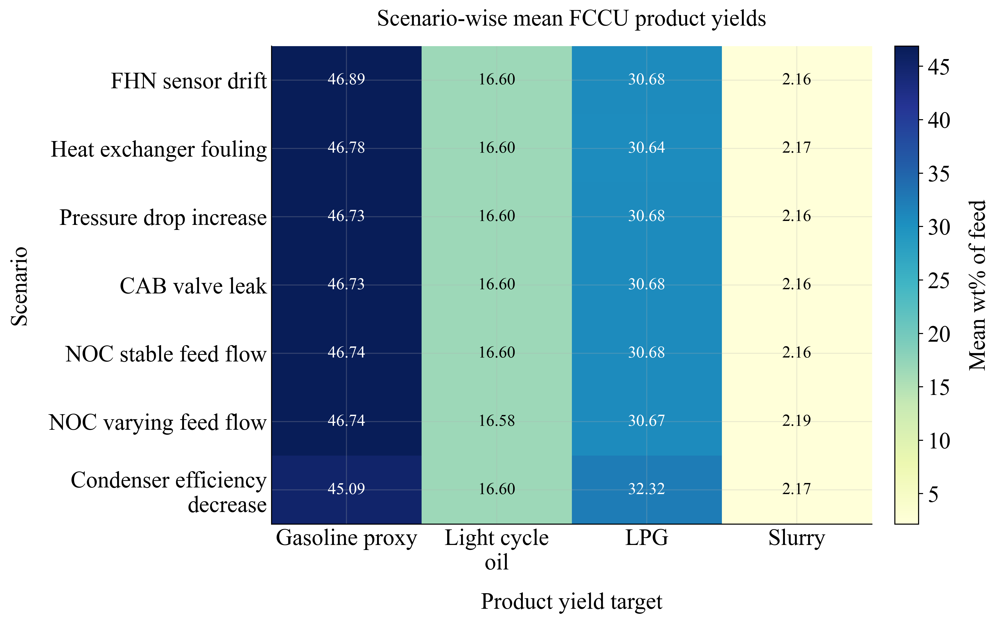

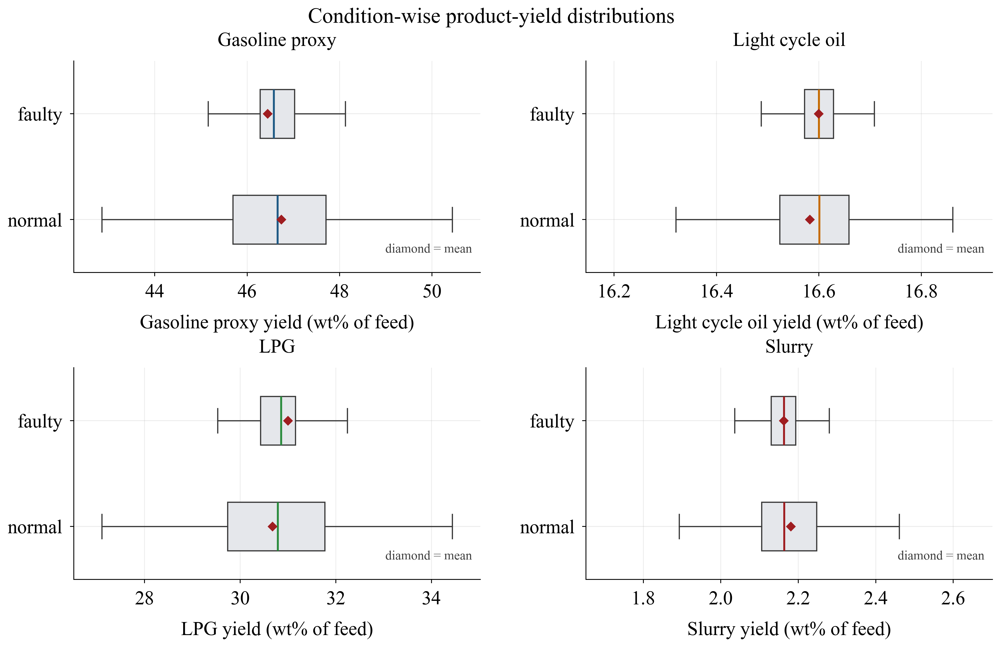

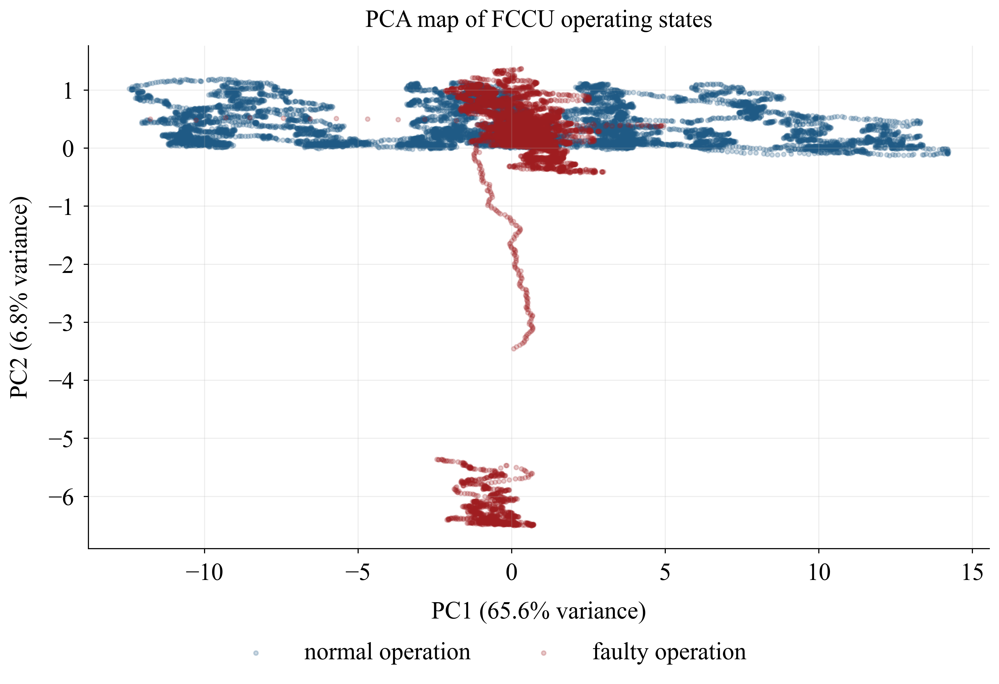

#### Compact labels used in the Pearson correlation matrix

,matrix_label,full_variable_name
0,Feed flow,Feed flow
1,Riser T,Riser temperature
2,Regen. T,Regenerator temperature
3,Delta P,Regenerator-reactor delta P
4,Standpipe level,Standpipe catalyst level
5,Stack CO,Stack gas CO
6,Gasoline,Gasoline proxy
7,LCO,Light cycle oil
8,LPG,LPG
9,Slurry,Slurry


,excluded_near_constant_variable
0,Fractionator overhead pressure


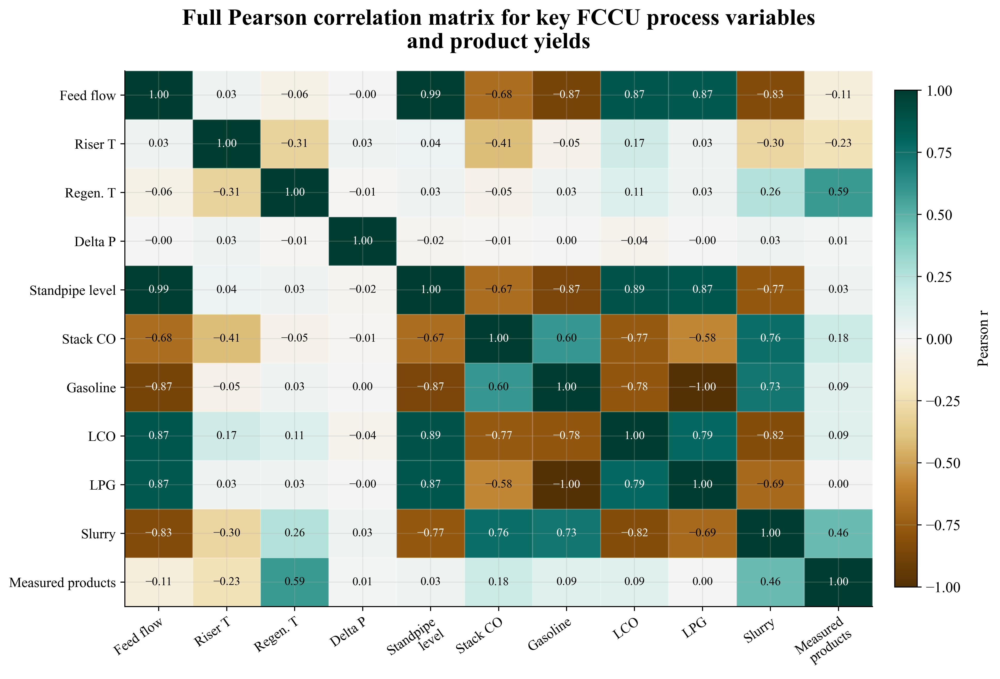

#### Feature-target association matrix computation protocol

,matrix,split,input_transform,visual_scaling,reported_value
0,Linear association,train only,raw valid variables,none,Pearson r
1,Rank/monotonic association,train only,rank transform within Spearman estimator,none,Spearman rho
2,General nonlinear dependence,train only,StandardScaler fitted on train features,target-wise max normalization for display only,normalized mutual information


,excluded_near_constant_feature
0,Fractionator overhead pressure


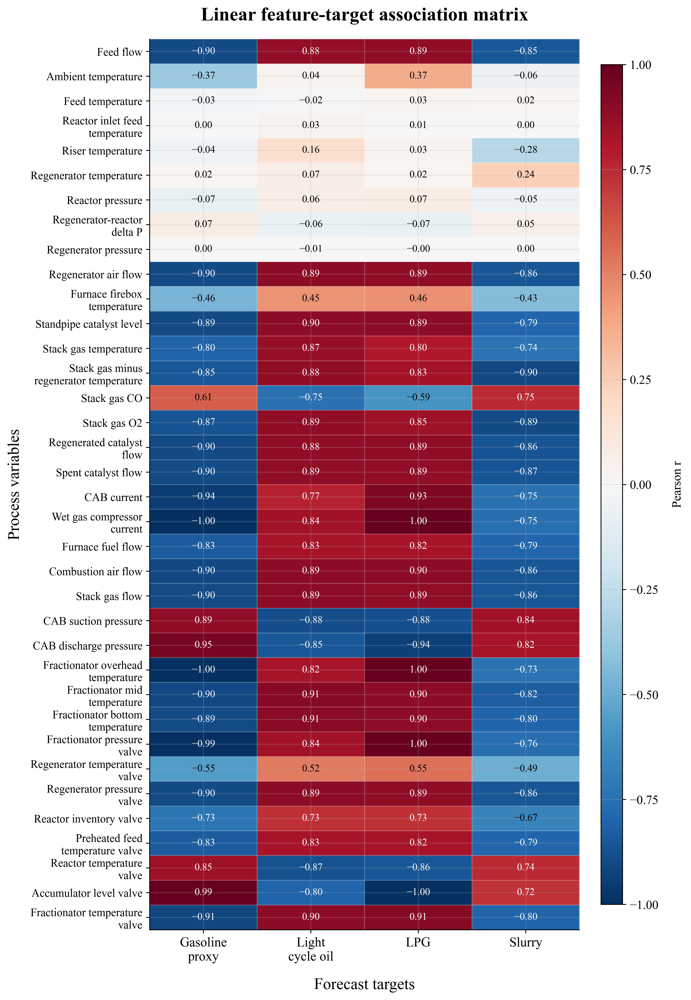

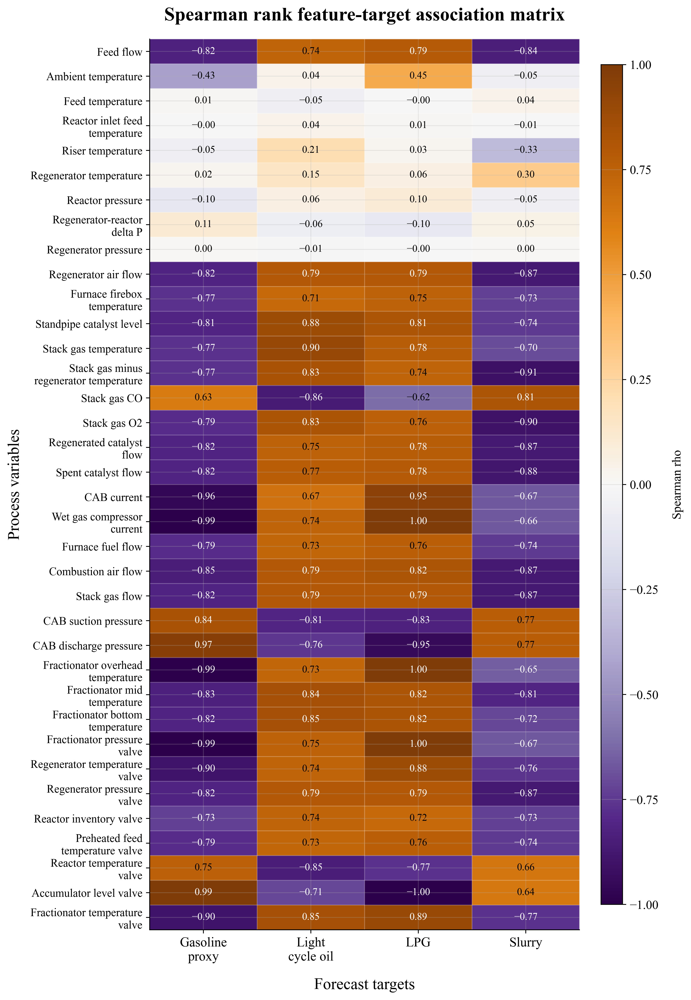

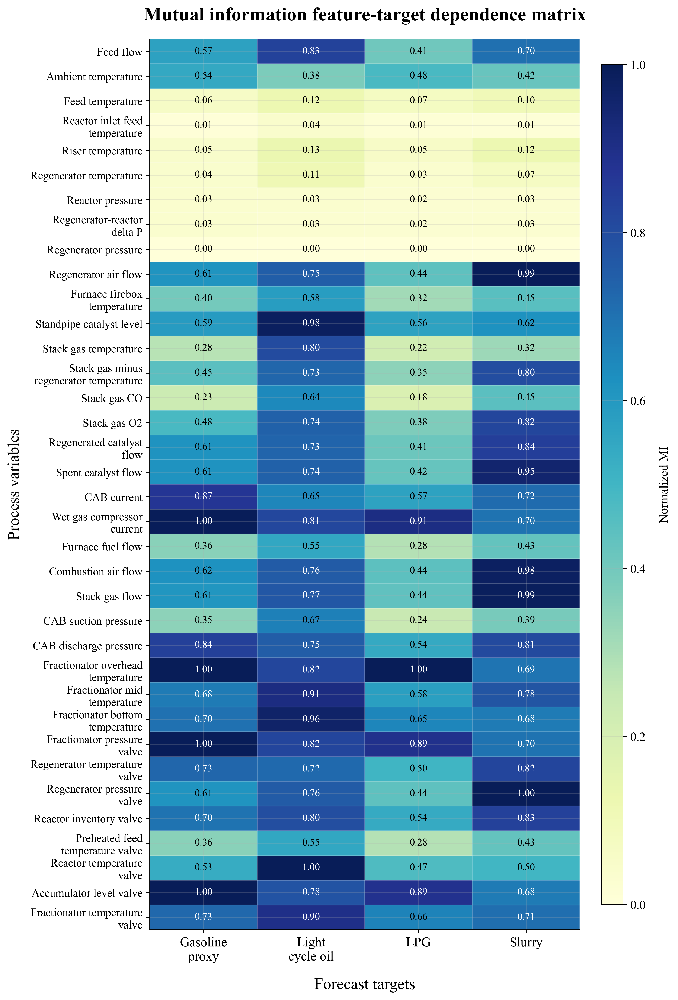

#### SHAP beeswarm explanations for each target

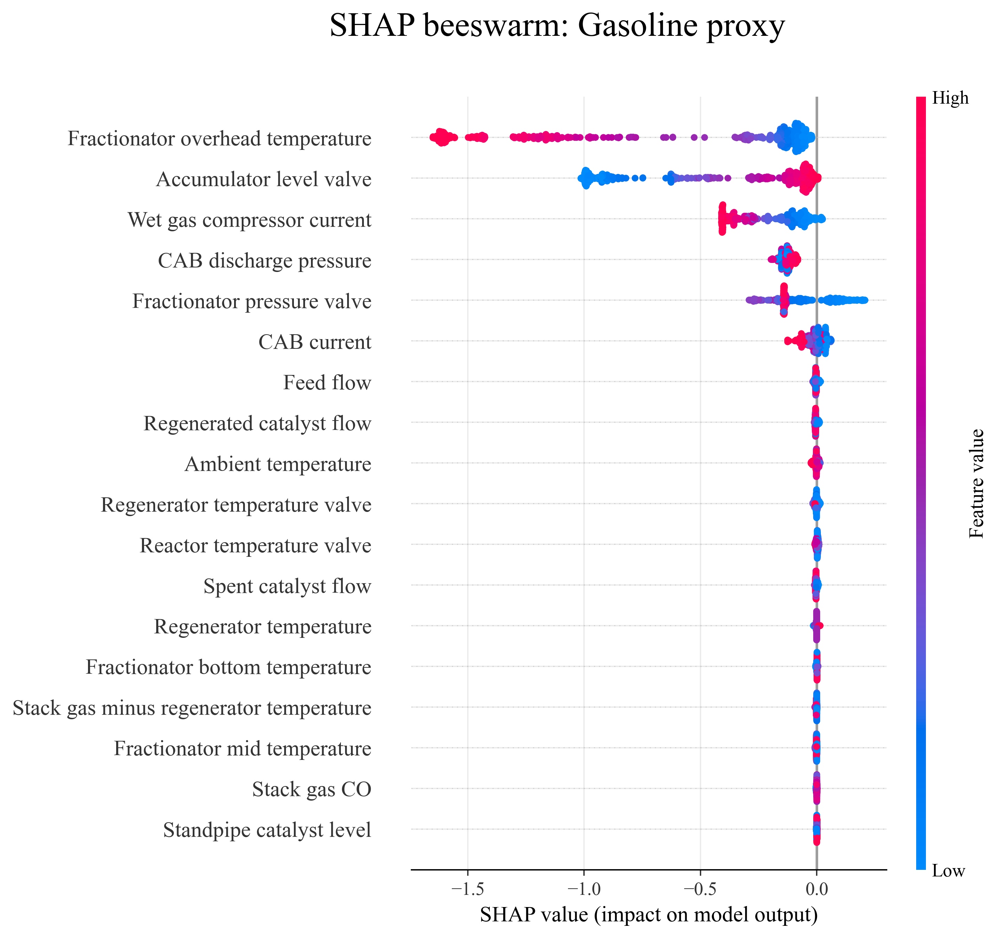

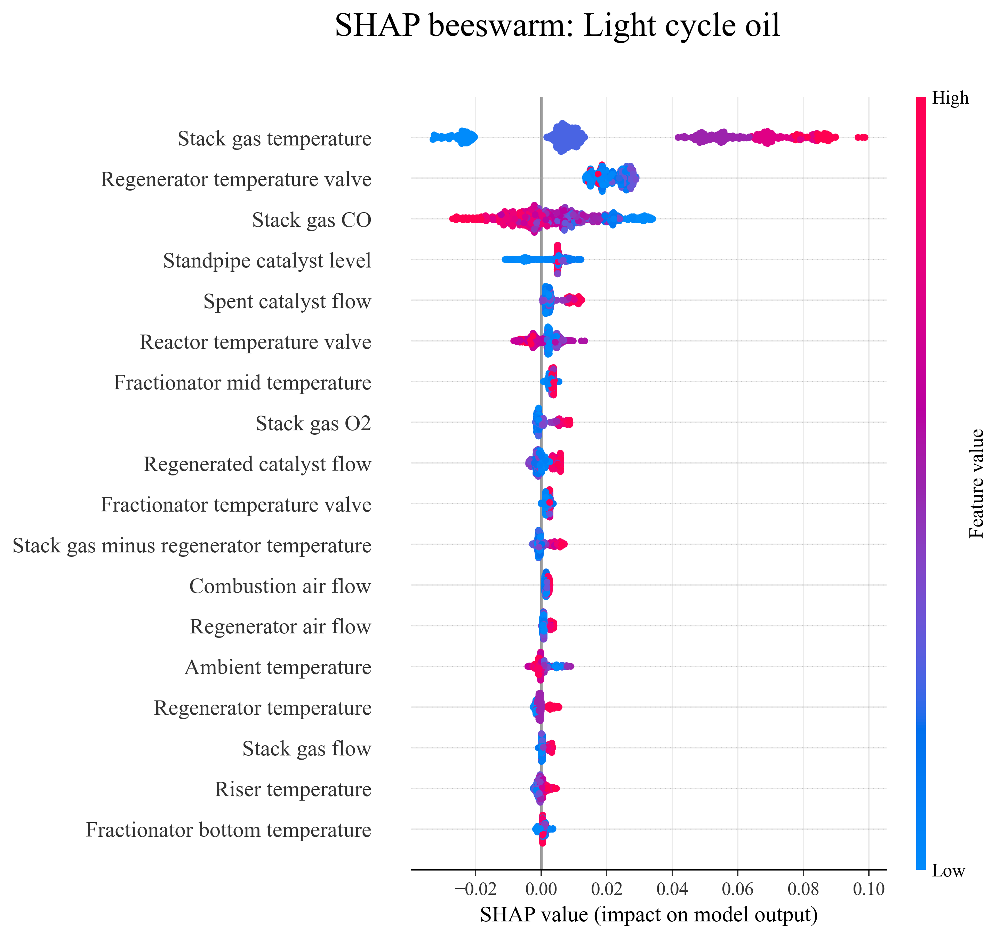

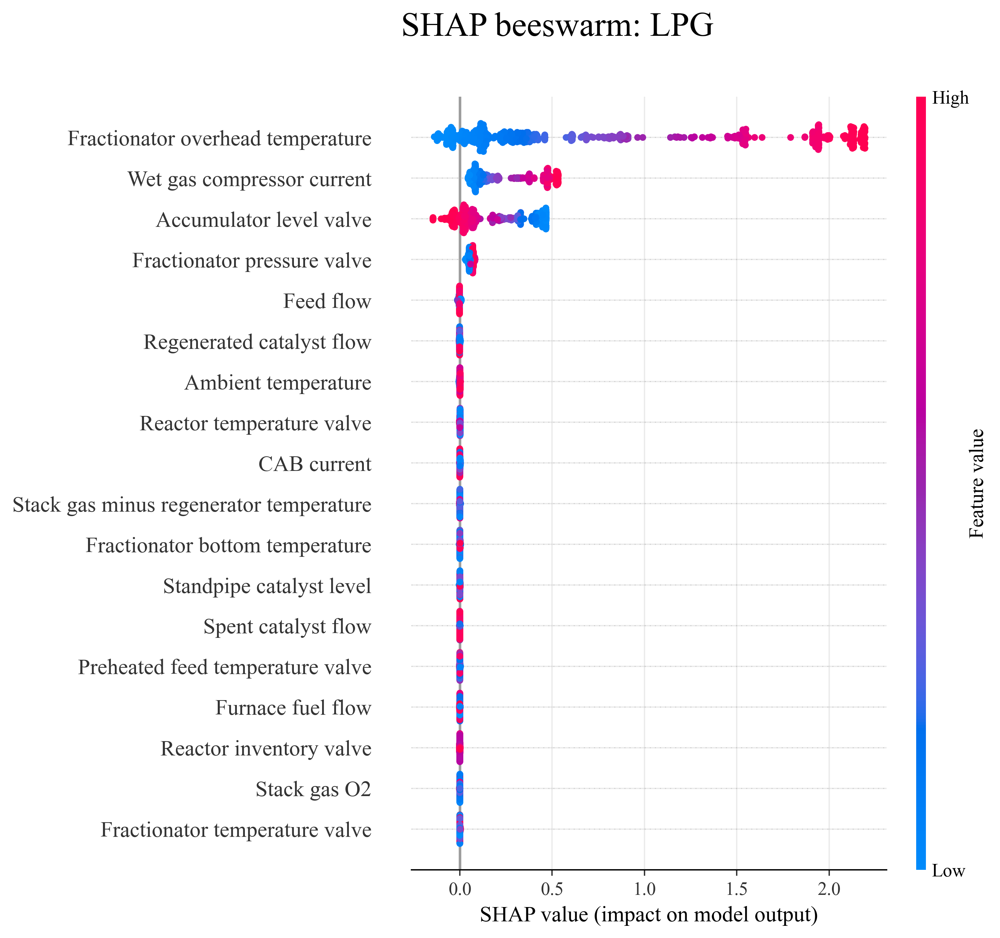

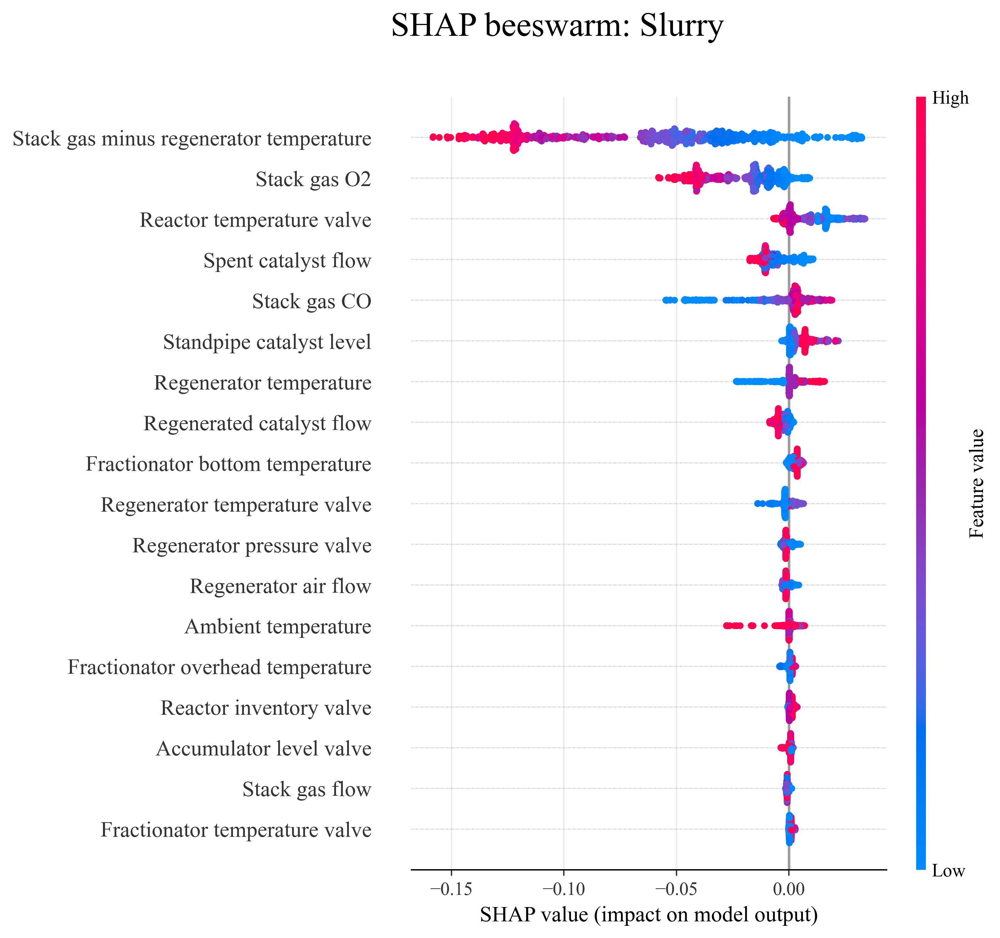

,target,top_shap_features,validation_rows_explained,train_rows_used
0,Gasoline proxy,"Fractionator overhead temperature, Accumulator...",700,3500
1,Light cycle oil,"Stack gas temperature, Regenerator temperature...",700,3500
2,LPG,"Fractionator overhead temperature, Wet gas com...",700,3500
3,Slurry,"Stack gas minus regenerator temperature, Stack...",700,3500


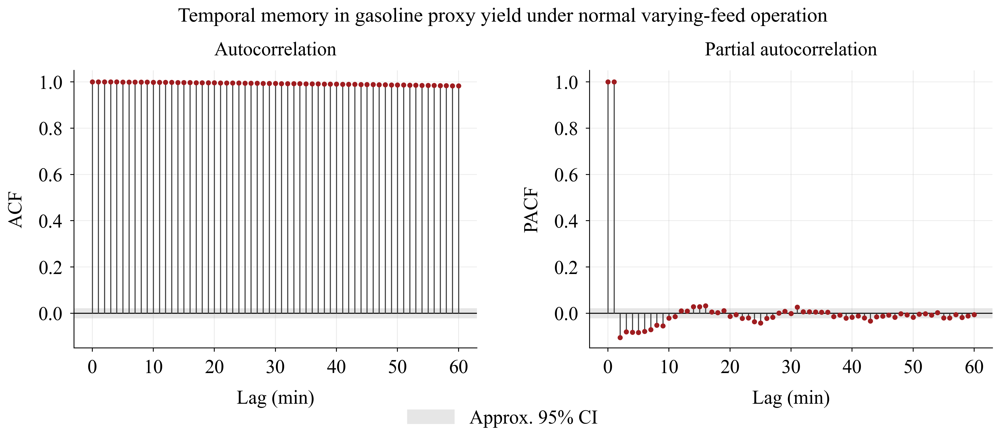

,feature,peak_lag_min,peak_corr
1,Riser temperature,0,-0.0633
3,Standpipe catalyst level,0,-0.1723
4,Stack gas CO,0,0.1777
2,Regenerator-reactor delta P,1,0.2317
0,Feed flow,4,-0.2567


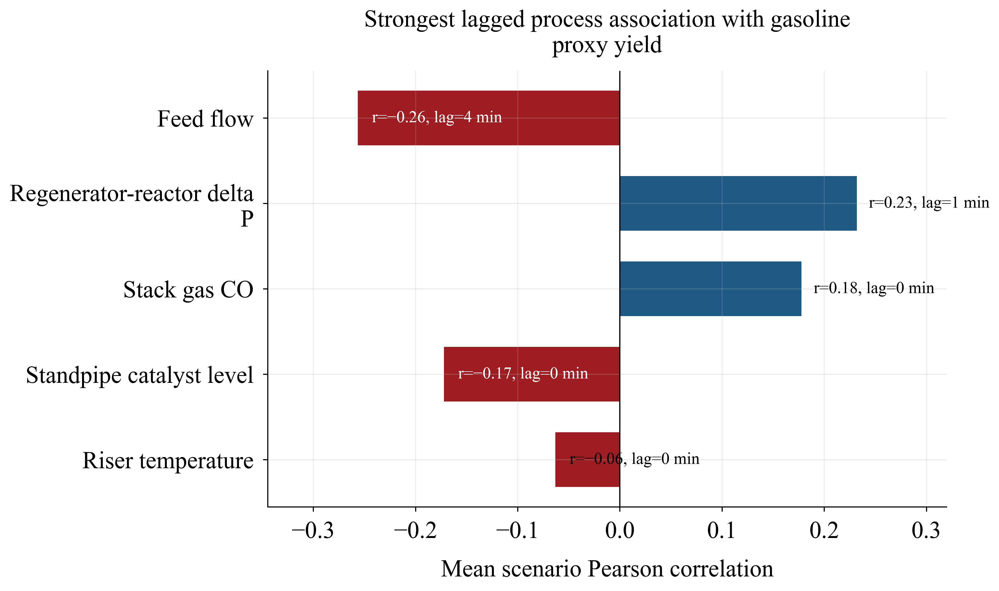

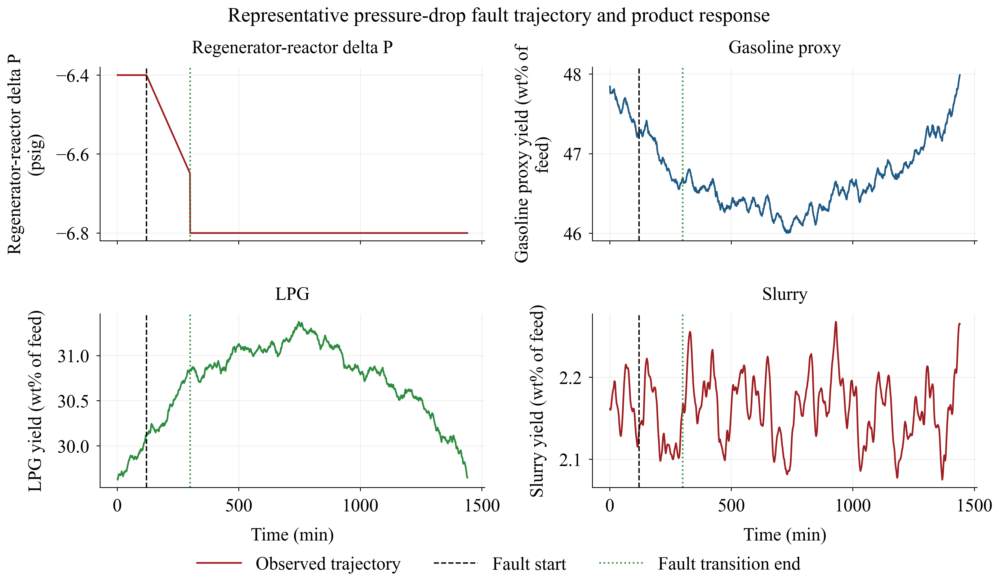

,conclusion,evidence
0,Data integrity,"No duplicate rows, no missing feature/target v..."
1,Forecasting motivation,ACF/PACF and lag-response diagnostics show per...
2,Modeling implication,The audit supports leakage-aware dynamic forec...


In [5]:
display(Markdown('### Journal-ready compact audit outputs'))

display_journal_audit_tables()
display_feature_statistical_audit()
plot_scenario_yield_heatmap()
plot_condition_target_distributions()
plot_operating_state_pca()
plot_full_correlation_heatmap()
plot_feature_target_association_matrices()
plot_shap_beeswarm_targets()
plot_acf_pacf_panel()
plot_lag_response_summary()
plot_representative_fault_trajectory()

final_audit_note = pd.DataFrame([
    {'conclusion': 'Data integrity', 'evidence': 'No duplicate rows, no missing feature/target values, monotonic time within all scenarios, and physically consistent derived yield columns.'},
    {'conclusion': 'Forecasting motivation', 'evidence': 'ACF/PACF and lag-response diagnostics show persistent temporal memory and lagged process-yield associations.'},
    {'conclusion': 'Modeling implication', 'evidence': 'The audit supports leakage-aware dynamic forecasting using chronological windows and both exogenous process variables and autoregressive yield history.'},
])
display(final_audit_note)